# Aprendizaje Automático II - Miguel Angel Ruiz Ortiz

### Tarea 5

Dada [esta](https://keras.io/examples/generative/ddim/) implementación en  de un Modelo de Difusión, modificar el código para emplear un Transformer en vez de la U-Net para realizar el muestreo inverso.

## Modelos de Denoising Difussion

Recordemos que los modelos de Denoising Difussion combinan un proceso de difusión hacia adelante, que agrega ruido Gaussiano progresivamente a una imagen, y un proceso inverso que lo elimina de manera iterativa a través de un modelo. El siguiente GIF se muestra en el [tutorial](https://keras.io/examples/generative/ddim/) e ilustra muy bien este concepto.

![diffusion process gif](https://i.imgur.com/dipPOfa.gif)

El [tutorial](https://keras.io/examples/generative/ddim/) implementa un modelo DDIM (Denoising Diffusion Implicit Models) con sampling determinístico, es decir, que el proceso inverso lo hace de manera deterministica en vez de obtiendo una muestra aleatoria. Este proceso inverso lo realiza mediante una U-Net que recibe una imagen ruidosa y la varianza $\beta_t$ correspondiente al paso $t$ correspondiente, y predice el ruido presente en la imagen. Nuestro objetivo es reemplazar la arquitectura U-Net por un modelo de Transformer-Encoder, dejando el demás código intacto.

## Setup

In [ ]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"

import math
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_datasets as tfds

import keras
from keras import layers
from keras import ops

## Hiperparámetros

In [ ]:
# data
dataset_name = "oxford_flowers102"
dataset_repetitions = 5

image_size = 64

# KID = Kernel Inception Distance, see related section
kid_image_size = 75
kid_diffusion_steps = 5
plot_diffusion_steps = 20

# sampling
min_signal_rate = 0.02
max_signal_rate = 0.95

# architecture
embedding_dims = 32
embedding_max_frequency = 1000.0
d_model = 256 # latent space dimension
num_heads = 8
dim_qkv =  int(d_model/num_heads)# dimension of query, key and values for MultiHeadAttention layer
dff = 512 # number of neurons of first layer in feed-forward networks
n_layers = 6 # number of layers in the Transformer encoder

# optimization
batch_size = 64
ema = 0.999
learning_rate = 1e-3 # initial learning rate
weight_decay = 1e-4

## Datos

Se utiliza el dataset [Oxford Flowers 102](https://www.tensorflow.org/datasets/catalog/oxford_flowers102) que contiene imágenes de flores. Con las siguientes funciones se prepara el dataset (ver [tutorial](https://keras.io/examples/generative/ddim/) para los detalles del preprocesamiento).

In [ ]:
def preprocess_image(data):
    # center crop image
    height = ops.shape(data["image"])[0]
    width = ops.shape(data["image"])[1]
    crop_size = ops.minimum(height, width)
    image = tf.image.crop_to_bounding_box(
        data["image"],
        (height - crop_size) // 2,
        (width - crop_size) // 2,
        crop_size,
        crop_size,
    )

    # resize and clip
    # for image downsampling it is important to turn on antialiasing
    image = tf.image.resize(image, size=[image_size, image_size], antialias=True)
    return ops.clip(image / 255.0, 0.0, 1.0)


def prepare_dataset(split):
    # the validation dataset is shuffled as well, because data order matters
    # for the KID estimation
    return (
        tfds.load(dataset_name, split=split, shuffle_files=True)
        .map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
        .cache()
        .repeat(dataset_repetitions)
        .shuffle(10 * batch_size)
        .batch(batch_size, drop_remainder=True)
        .prefetch(buffer_size=tf.data.AUTOTUNE)
    )

In [ ]:
# load dataset
train_dataset = prepare_dataset("train[:80%]+validation[:80%]+test[:80%]")
val_dataset = prepare_dataset("train[80%:]+validation[80%:]+test[80%:]")

## Distancia Kernel Inception

Se utiliza la distancia Kernel Inception (KID) como métrica para la calidad de una imagen. El siguiente código implementa dicha métrica. Sólo se obtiene para el conjunto de validación.

In [ ]:
@keras.saving.register_keras_serializable()
class KID(keras.metrics.Metric):
    def __init__(self, name, **kwargs):
        super().__init__(name=name, **kwargs)

        # KID is estimated per batch and is averaged across batches
        self.kid_tracker = keras.metrics.Mean(name="kid_tracker")

        # a pretrained InceptionV3 is used without its classification layer
        # transform the pixel values to the 0-255 range, then use the same
        # preprocessing as during pretraining
        self.encoder = keras.Sequential(
            [
                keras.Input(shape=(image_size, image_size, 3)),
                layers.Rescaling(255.0),
                layers.Resizing(height=kid_image_size, width=kid_image_size),
                layers.Lambda(keras.applications.inception_v3.preprocess_input),
                keras.applications.InceptionV3(
                    include_top=False,
                    input_shape=(kid_image_size, kid_image_size, 3),
                    weights="imagenet",
                ),
                layers.GlobalAveragePooling2D(),
            ],
            name="inception_encoder",
        )

    def polynomial_kernel(self, features_1, features_2):
        feature_dimensions = ops.cast(ops.shape(features_1)[1], dtype="float32")
        return (
            features_1 @ ops.transpose(features_2) / feature_dimensions + 1.0
        ) ** 3.0

    def update_state(self, real_images, generated_images, sample_weight=None):
        real_features = self.encoder(real_images, training=False)
        generated_features = self.encoder(generated_images, training=False)

        # compute polynomial kernels using the two sets of features
        kernel_real = self.polynomial_kernel(real_features, real_features)
        kernel_generated = self.polynomial_kernel(
            generated_features, generated_features
        )
        kernel_cross = self.polynomial_kernel(real_features, generated_features)

        # estimate the squared maximum mean discrepancy using the average kernel values
        batch_size = real_features.shape[0]
        batch_size_f = ops.cast(batch_size, dtype="float32")
        mean_kernel_real = ops.sum(kernel_real * (1.0 - ops.eye(batch_size))) / (
            batch_size_f * (batch_size_f - 1.0)
        )
        mean_kernel_generated = ops.sum(
            kernel_generated * (1.0 - ops.eye(batch_size))
        ) / (batch_size_f * (batch_size_f - 1.0))
        mean_kernel_cross = ops.mean(kernel_cross)
        kid = mean_kernel_real + mean_kernel_generated - 2.0 * mean_kernel_cross

        # update the average KID estimate
        self.kid_tracker.update_state(kid)

    def result(self):
        return self.kid_tracker.result()

    def reset_state(self):
        self.kid_tracker.reset_state()


## Arquitectura de la red neuronal basada en el Transformer-Encoder.

El código siguiente es la implementación del Encoder del Transformer que se desarrolló en tareas pasadas.

In [ ]:
def positional_embedding(pos: int, k: int, d_model: int) -> float:
    i = k // 2  # k = 2*i + (k%2)

    if k % 2 == 0:
        return math.sin(pos / (10000 ** (2 * i / d_model)))
    else:
        return math.cos(pos / (10000 ** (2 * i / d_model)))

@keras.saving.register_keras_serializable()
class ClassicPositionalEmbedding(keras.Layer):
    def __init__(self, max_length: int, d_model: int, **kwargs):
        super().__init__(**kwargs)

        self.max_length = max_length
        self.d_model = d_model

        # creating positional encodings
        self.pos_encoding = tf.constant(
            [
                [positional_embedding(pos, k, d_model) for k in range(d_model)]
                for pos in range(max_length)
            ]
        )

    def call(self, inputs):
        # add positional encoding to input
        # we assume inputs have shape (batch_size, N, d_model), where N <= max_length
        # if inputs_length is None, then we assume inputs_length equals max_length
        N = inputs.shape[1]

        return inputs + self.pos_encoding[:N, :]

    def get_config(self):
        config = super().get_config()
        config['max_length'] = self.max_length
        config['d_model'] = self.d_model

        return config

@keras.saving.register_keras_serializable()
class FeedForward(tf.keras.Layer):
    def __init__(self, d_model: int, dff: int, **kwargs):
        super().__init__(**kwargs)
        self.d_model = d_model
        self.dff = dff

        # two linear transformations with a ReLU activation function between
        self.feedforward_net = keras.models.Sequential(
            [
                keras.layers.Dense(dff, activation="relu"),
                keras.layers.Dense(d_model),
            ]
        )

        # Residual connection
        self.add = tf.keras.layers.Add()

        # Layer Normalization
        self.layer_norm = tf.keras.layers.LayerNormalization()

    def call(self, inputs):
        x = self.feedforward_net(inputs)
        x = self.add([inputs, x])
        x = self.layer_norm(x)
        return x

    def get_config(self):
        config = super().get_config()
        config['d_model'] = self.d_model
        config['dff'] = self.dff

        return config

@keras.saving.register_keras_serializable()
class EncoderLayer(keras.Layer):
    def __init__(self, num_heads: int, dim_qkv: int, d_model: int, dff: int, **kwargs):
        super().__init__(**kwargs)
        self.num_heads = num_heads
        self.dim_qkv = dim_qkv
        self.d_model = d_model
        self.dff = dff

        # Multi-Head attention layer
        self.multi_head_attention = keras.layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=dim_qkv, use_bias=False
        )

        # Residual connection
        self.add_layer = keras.layers.Add()

        # Layer Normalization
        self.layer_norm = keras.layers.LayerNormalization()

        # Feed-Forward Network
        self.ff_sublayer = FeedForward(d_model=d_model, dff=dff)

    def call(self, inputs):
        x = self.multi_head_attention(query=inputs, value=inputs)
        x = self.add_layer([inputs, x])
        x = self.layer_norm(x)
        x = self.ff_sublayer(x)

        return x

    def get_config(self):
        config = super().get_config()
        config['d_model'] = self.d_model
        config['num_heads'] = self.num_heads
        config['dim_qkv'] = self.dim_qkv
        config['dff'] = self.dff

        return config

@keras.saving.register_keras_serializable()
class TransformerEncoder(keras.Model):
    def __init__(
        self,
        num_heads: int,
        n_layers: int,
        sequence_length: int,
        d_model: int,
        dim_qkv: int,
        dff: int,
        **kwargs
        ):
        super().__init__(**kwargs)

        self.num_heads = num_heads
        self.n_layers = n_layers
        self.d_model = d_model
        self.dim_qkv = dim_qkv
        self.dff = dff
        self.sequence_length = sequence_length

        self.positional_encoding = ClassicPositionalEmbedding(
            max_length=sequence_length, d_model=d_model
        )
        self.encoder_layers = [
            EncoderLayer(num_heads=num_heads, dim_qkv=dim_qkv, d_model=d_model, dff=dff)
            for _ in range(n_layers)
        ]

    def call(self, inputs):
        x = self.positional_encoding(inputs)

        for i in range(self.n_layers):
            x = self.encoder_layers[i](x)

        return x

    def get_config(self):
        config = super().get_config()
        config['d_model'] = self.d_model
        config['num_heads'] = self.num_heads
        config['dim_qkv'] = self.dim_qkv
        config['dff'] = self.dff
        config['n_layers'] = self.n_layers
        config['sequence_length'] = self.sequence_length

        return config

La red neuronal recibe una imagen ruidosa y la varianza $\beta_t$ correspondiente al paso $t$ correspondiente, y predice el ruido presente en la imagen. Consta de las siguientes partes:

1.   A la varianza del ruido se le aplica el embedding sinusoidal, similar al positional embedding que se utiliza en los Transformers, de tal manera que se obtiene un vector de tamaño 32. Con cada entrada de dicho vector se genera un tensor de tamaño (```image_size```, ```image_size```, 32) (aquí las imágenes son de ```image_size = 64```), de tal manera que las matrices de cada canal son constantes, y cada constante corresponde a una entrada del sinuosidal embedding de la varianza.
2.   A la imagen se le aplica una convolución 2D con 32 filtros y tamaño de kernel 1, para obtener un tensor de tamaño (```image_size```, ```image_size```, 32).
3. Los tensores obtenidos en los pasos anteriores se concatenan en la última dimensión, obteniendo un tensor de tamaño (```image_size```, ```image_size```, 64).
4. Al hacer un reshape cuyo output tenga tamaño (```seq_length```, ```d_model```), obtenemos una secuencia de tamaño ```seq_length``` de vectores de dimensión ```d_model```. Esta secuencia se introduce en el encoder del transformer.
5. Al output del encoder del transformer se le hace un reshape de tal manera que volvemos a obtener un tensor de tamaño (```image_size```, ```image_size```, 64).

Los parámetros del encoder se mostraron al inicio del notebook en la sección "Hiperparámetros".

In [ ]:
@keras.saving.register_keras_serializable()
def sinusoidal_embedding(x):
    embedding_min_frequency = 1.0
    frequencies = ops.exp(
        ops.linspace(
            ops.log(embedding_min_frequency),
            ops.log(embedding_max_frequency),
            embedding_dims // 2,
        )
    )
    angular_speeds = ops.cast(2.0 * math.pi * frequencies, "float32")
    embeddings = ops.concatenate(
        [ops.sin(angular_speeds * x), ops.cos(angular_speeds * x)], axis=3
    )
    return embeddings

In [ ]:
def get_network(image_size: int, d_model: int, num_heads: int, dim_qkv: int, dff: int, n_layers: int):
    noisy_images = keras.Input(shape=(image_size, image_size, 3))
    noise_variances = keras.Input(shape=(1, 1, 1))

    e = layers.Lambda(sinusoidal_embedding, output_shape=(1, 1, 32))(noise_variances)
    e = layers.UpSampling2D(size=image_size, interpolation="nearest")(e)

    x = layers.Conv2D(32, kernel_size=1)(noisy_images)
    x = layers.Concatenate()([x, e])

    shape_before = x.shape # (batch_size, N, N, 64)

    seq = layers.Reshape((-1, d_model))(x)

    output_seq = TransformerEncoder(
        num_heads=num_heads,
        n_layers=n_layers,
        sequence_length=seq.shape[1],
        d_model=d_model,
        dim_qkv=dim_qkv,
        dff=dff,
    )(seq)

    x = layers.Reshape(shape_before[1:])(output_seq) # reshape as (N, N, d_model)

    # Final convolution
    x = layers.Conv2D(3, kernel_size=1)(x)  # Output image with 3 channels

    return keras.Model([noisy_images, noise_variances], x)



## Modelo de difusión

El esquema de calenderización coseno es el que se utiliza para ir incrementando la varianza $\beta_t$ conforme pasa el tiempo. El procedimiento de entrenamiento de los modelos de difusión para eliminación de ruido consiste en seleccionar tiempos de difusión aleatorios, mezclar imágenes de entrenamiento con ruido gaussiano según las tasas correspondientes, y entrenar el modelo para separar la imagen ruidosa en sus componentes de señal y ruido. Como función de costo se utiliza el error absoluto medio entre el ruido real y el ruido estimado por la red neuronal. Debajo se encuentra el código correspondiente al modelo de difusión completo.

Note que cambiamos la función ```get_network``` para introducir la lógica del encoder del transformer, y el modelo DiffusionModel quedó igual salvo los parámetros recibidos asociados al encoder del Transformer.

In [ ]:
@keras.saving.register_keras_serializable()
class DiffusionModel(keras.Model):
    def __init__(self, image_size: int, d_model: int, num_heads: int, dim_qkv: int, dff: int, n_layers: int):
        super().__init__()

        self.normalizer = layers.Normalization()
        self.network = get_network(image_size, d_model, num_heads, dim_qkv, dff, n_layers)
        self.ema_network = keras.models.clone_model(self.network)

    def compile(self, **kwargs):
        super().compile(**kwargs)

        self.noise_loss_tracker = keras.metrics.Mean(name="n_loss")
        self.image_loss_tracker = keras.metrics.Mean(name="i_loss")
        self.kid = KID(name="kid")

    @property
    def metrics(self):
        return [self.noise_loss_tracker, self.image_loss_tracker, self.kid]

    def denormalize(self, images):
        # convert the pixel values back to 0-1 range
        images = self.normalizer.mean + images * self.normalizer.variance**0.5
        return ops.clip(images, 0.0, 1.0)

    def diffusion_schedule(self, diffusion_times):
        # diffusion times -> angles
        start_angle = ops.cast(ops.arccos(max_signal_rate), "float32")
        end_angle = ops.cast(ops.arccos(min_signal_rate), "float32")

        diffusion_angles = start_angle + diffusion_times * (end_angle - start_angle)

        # angles -> signal and noise rates
        signal_rates = ops.cos(diffusion_angles)
        noise_rates = ops.sin(diffusion_angles)
        # note that their squared sum is always: sin^2(x) + cos^2(x) = 1

        return noise_rates, signal_rates

    def denoise(self, noisy_images, noise_rates, signal_rates, training):
        # the exponential moving average weights are used at evaluation
        if training:
            network = self.network
        else:
            network = self.ema_network

        # predict noise component and calculate the image component using it
        pred_noises = network([noisy_images, noise_rates**2], training=training)
        pred_images = (noisy_images - noise_rates * pred_noises) / signal_rates

        return pred_noises, pred_images

    def reverse_diffusion(self, initial_noise, diffusion_steps):
        # reverse diffusion = sampling
        num_images = initial_noise.shape[0]
        step_size = 1.0 / diffusion_steps

        # important line:
        # at the first sampling step, the "noisy image" is pure noise
        # but its signal rate is assumed to be nonzero (min_signal_rate)
        next_noisy_images = initial_noise
        for step in range(diffusion_steps):
            noisy_images = next_noisy_images

            # separate the current noisy image to its components
            diffusion_times = ops.ones((num_images, 1, 1, 1)) - step * step_size
            noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=False
            )
            # network used in eval mode

            # remix the predicted components using the next signal and noise rates
            next_diffusion_times = diffusion_times - step_size
            next_noise_rates, next_signal_rates = self.diffusion_schedule(
                next_diffusion_times
            )
            next_noisy_images = (
                next_signal_rates * pred_images + next_noise_rates * pred_noises
            )
            # this new noisy image will be used in the next step

        return pred_images

    def generate(self, num_images, diffusion_steps):
        # noise -> images -> denormalized images
        initial_noise = keras.random.normal(
            shape=(num_images, image_size, image_size, 3)
        )
        generated_images = self.reverse_diffusion(initial_noise, diffusion_steps)
        generated_images = self.denormalize(generated_images)
        return generated_images

    def train_step(self, images):
        # normalize images to have standard deviation of 1, like the noises
        images = self.normalizer(images, training=True)
        noises = keras.random.normal(shape=(batch_size, image_size, image_size, 3))

        # sample uniform random diffusion times
        diffusion_times = keras.random.uniform(
            shape=(batch_size, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        # mix the images with noises accordingly
        noisy_images = signal_rates * images + noise_rates * noises

        with tf.GradientTape() as tape:
            # train the network to separate noisy images to their components
            pred_noises, pred_images = self.denoise(
                noisy_images, noise_rates, signal_rates, training=True
            )

            noise_loss = self.loss(noises, pred_noises)  # used for training
            image_loss = self.loss(images, pred_images)  # only used as metric

        gradients = tape.gradient(noise_loss, self.network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.network.trainable_weights))

        self.noise_loss_tracker.update_state(noise_loss)
        self.image_loss_tracker.update_state(image_loss)

        # track the exponential moving averages of weights
        for weight, ema_weight in zip(self.network.weights, self.ema_network.weights):
            ema_weight.assign(ema * ema_weight + (1 - ema) * weight)

        # KID is not measured during the training phase for computational efficiency
        return {m.name: m.result() for m in self.metrics[:-1]}

    def test_step(self, images):
        # normalize images to have standard deviation of 1, like the noises
        images = self.normalizer(images, training=False)
        noises = keras.random.normal(shape=(batch_size, image_size, image_size, 3))

        # sample uniform random diffusion times
        diffusion_times = keras.random.uniform(
            shape=(batch_size, 1, 1, 1), minval=0.0, maxval=1.0
        )
        noise_rates, signal_rates = self.diffusion_schedule(diffusion_times)
        # mix the images with noises accordingly
        noisy_images = signal_rates * images + noise_rates * noises

        # use the network to separate noisy images to their components
        pred_noises, pred_images = self.denoise(
            noisy_images, noise_rates, signal_rates, training=False
        )

        noise_loss = self.loss(noises, pred_noises)
        image_loss = self.loss(images, pred_images)

        self.image_loss_tracker.update_state(image_loss)
        self.noise_loss_tracker.update_state(noise_loss)

        # measure KID between real and generated images
        # this is computationally demanding, kid_diffusion_steps has to be small
        images = self.denormalize(images)
        generated_images = self.generate(
            num_images=batch_size, diffusion_steps=kid_diffusion_steps
        )
        self.kid.update_state(images, generated_images)

        return {m.name: m.result() for m in self.metrics}

    def plot_images(self, epoch=None, logs=None, num_rows=3, num_cols=6):
        # plot random generated images for visual evaluation of generation quality
        generated_images = self.generate(
            num_images=num_rows * num_cols,
            diffusion_steps=plot_diffusion_steps,
        )

        plt.figure(figsize=(num_cols * 2.0, num_rows * 2.0))
        for row in range(num_rows):
            for col in range(num_cols):
                index = row * num_cols + col
                plt.subplot(num_rows, num_cols, index + 1)
                plt.imshow(generated_images[index])
                plt.axis("off")
        plt.tight_layout()
        plt.show()
        plt.close()


## Entrenamiento

Se optó por entrenar "a pedazos" o "por batches". Es decir, cada cierto número de épocas se entrenaba con ciertos parámetros del optimizador y se guardaba el mejor modelo encontrado. Si algo sucedía mal se volvía a retomar el entrenamiento empezando por el mejor punto encontrado en el entrenamiento anterior y se cambiaban por otros parámetros para el optimizador. Esto sucedía por ejemplo que los pesos se salieran de una zona cercana a un mínimo deseado, o se estancaran sin obtener buenos resultados. A continuación una tabla con los entrenamientos a pedazos que se realizaron:

| # de batch | Optimizador | Tamaño de paso | # de épocas |
|------------------|-----------------|-----------------|-----|
| 1 | AdamW | 1e-3 | 25 |
| 2 | Adam | 1e-4 | 10 |
| 3 | Adam | 1e-5 | 10 |
| 4 | AdamW | 1e-5 | 10 |
| 5 | Adam | 1e-5 | 10 |

El parámetro de ```weight_decay``` para AdamW fue el mismo en todos los casos e igual al del tutorial.

Los resultados de cada batch de entrenamiento se muestran en la sección de resultados. Aquí en esta sección sólo se muestra lo correspondienteúal ultimo batch de entrenamiento.

In [ ]:
# create and compile the model
model = DiffusionModel(image_size, d_model, num_heads, dim_qkv, dff, n_layers)
# below tensorflow 2.9:
# pip install tensorflow_addons
# import tensorflow_addons as tfa
# optimizer=tfa.optimizers.AdamW
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=1e-5, #weight_decay=weight_decay
    ),
    loss=keras.losses.mean_absolute_error,
)
# pixelwise mean absolute error is used as loss

# save the best model based on the validation KID metric
checkpoint_path = "checkpoints/diffusion_model.weights.h5"
checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    monitor="val_kid",
    mode="min",
    save_best_only=True,
)

# Save the model with the minimum validation loss
checkpoint_path_loss = "checkpoints/diffusion_model_loss.weights.h5"
checkpoint_loss = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_path_loss,
    save_weights_only=True,
    monitor="val_n_loss",
    mode="min",
    save_best_only=True
)

# calculate mean and variance of training dataset for normalization
model.normalizer.adapt(train_dataset)

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 154 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


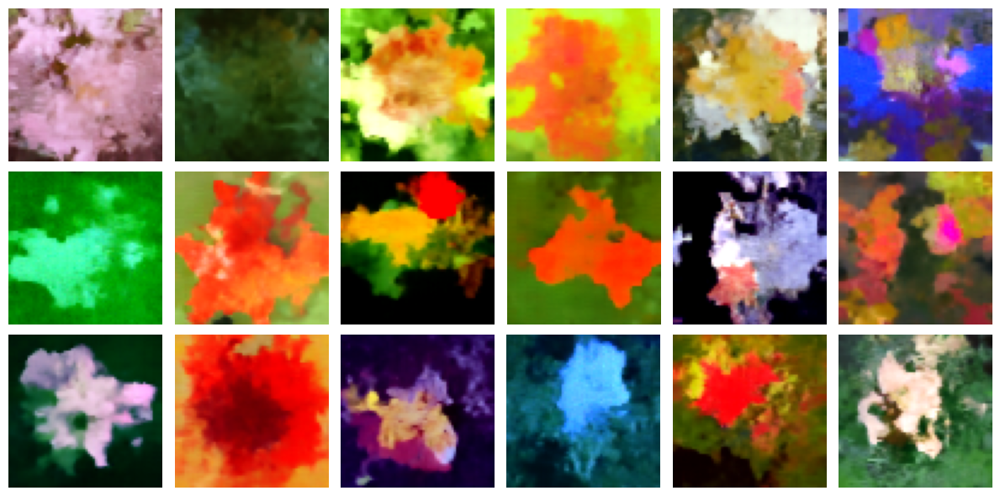

In [ ]:
READ_CHECKPOINT = True
if READ_CHECKPOINT:
    model.load_weights(checkpoint_path)
    model.plot_images()


Epoch 1/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - i_loss: 0.2371 - n_loss: 0.1503

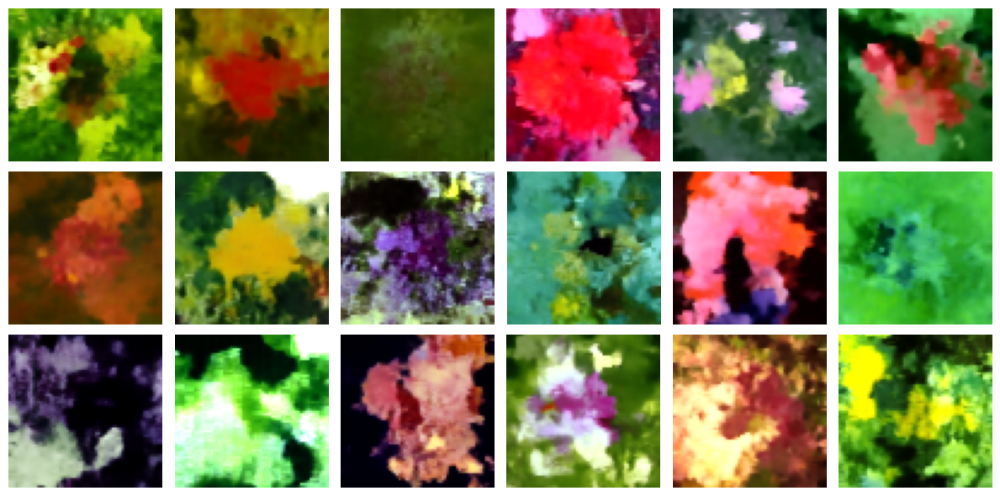

511/511 ━━━━━━━━━━━━━━━━━━━━ 218s 356ms/step - i_loss: 0.2371 - n_loss: 0.1503 - val_i_loss: 0.2392 - val_kid: 0.4650 - val_n_loss: 0.1494
Epoch 2/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - i_loss: 0.2394 - n_loss: 0.1491

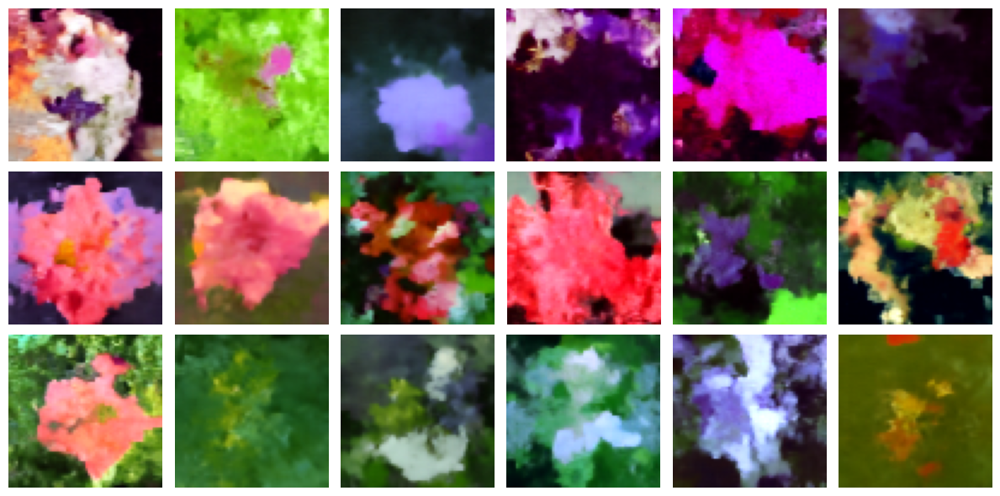

511/511 ━━━━━━━━━━━━━━━━━━━━ 153s 299ms/step - i_loss: 0.2394 - n_loss: 0.1491 - val_i_loss: 0.2398 - val_kid: 0.4718 - val_n_loss: 0.1494
Epoch 3/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - i_loss: 0.2393 - n_loss: 0.1491

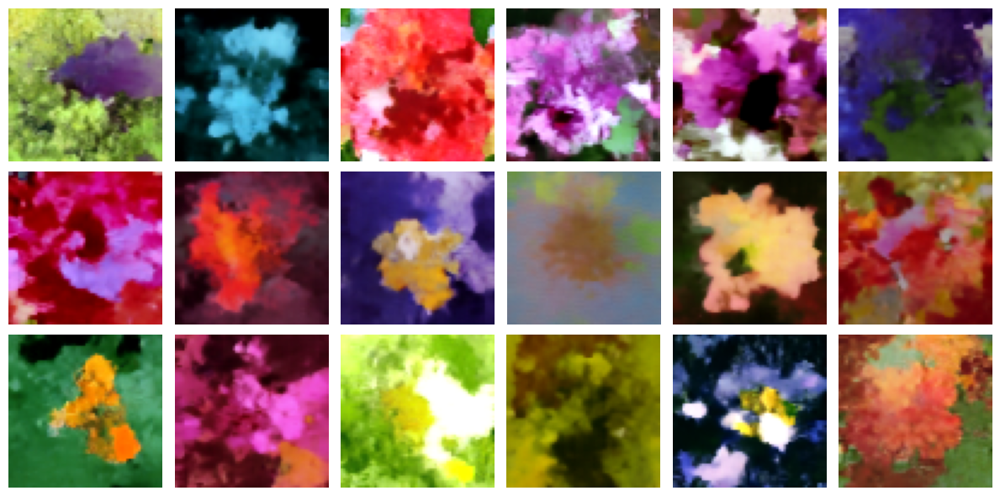

511/511 ━━━━━━━━━━━━━━━━━━━━ 152s 298ms/step - i_loss: 0.2393 - n_loss: 0.1491 - val_i_loss: 0.2404 - val_kid: 0.4677 - val_n_loss: 0.1484
Epoch 4/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - i_loss: 0.2378 - n_loss: 0.1495

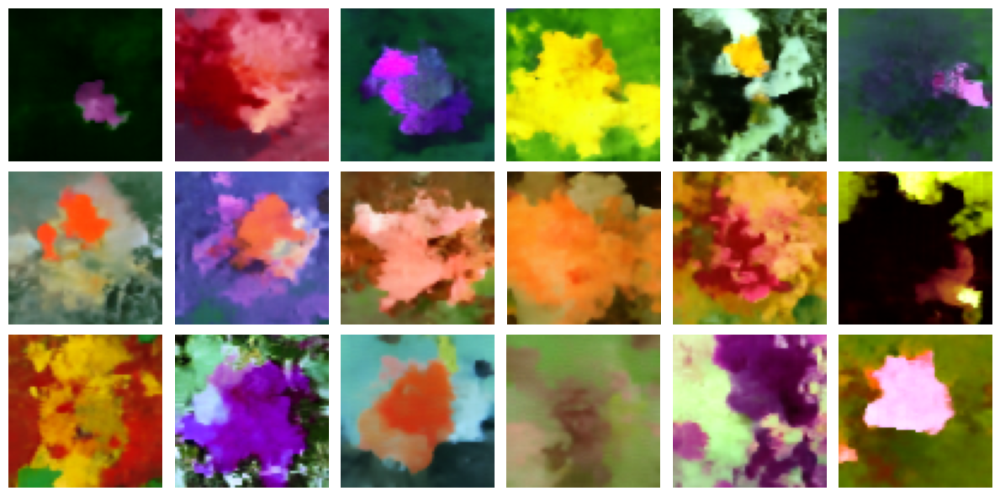

511/511 ━━━━━━━━━━━━━━━━━━━━ 153s 300ms/step - i_loss: 0.2378 - n_loss: 0.1495 - val_i_loss: 0.2391 - val_kid: 0.4507 - val_n_loss: 0.1484
Epoch 5/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - i_loss: 0.2394 - n_loss: 0.1486

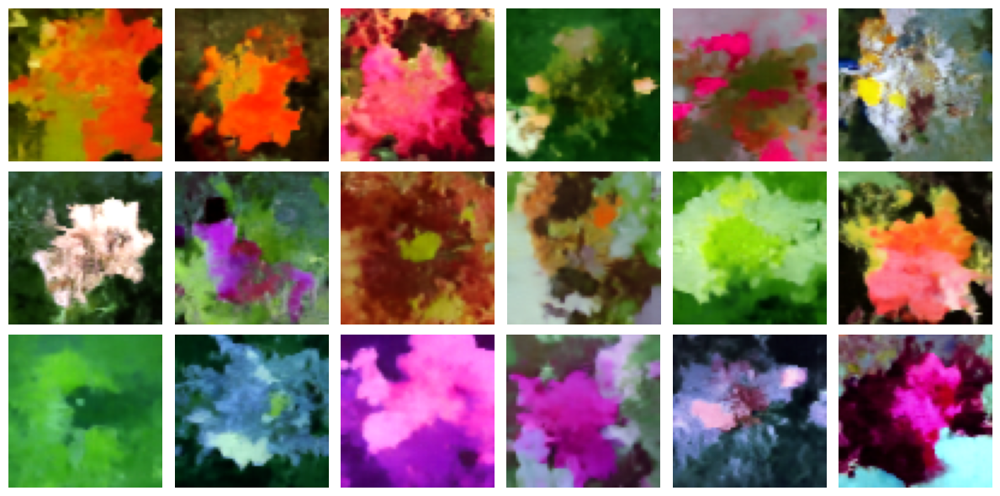

511/511 ━━━━━━━━━━━━━━━━━━━━ 151s 296ms/step - i_loss: 0.2394 - n_loss: 0.1486 - val_i_loss: 0.2404 - val_kid: 0.4616 - val_n_loss: 0.1485
Epoch 6/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - i_loss: 0.2401 - n_loss: 0.1492

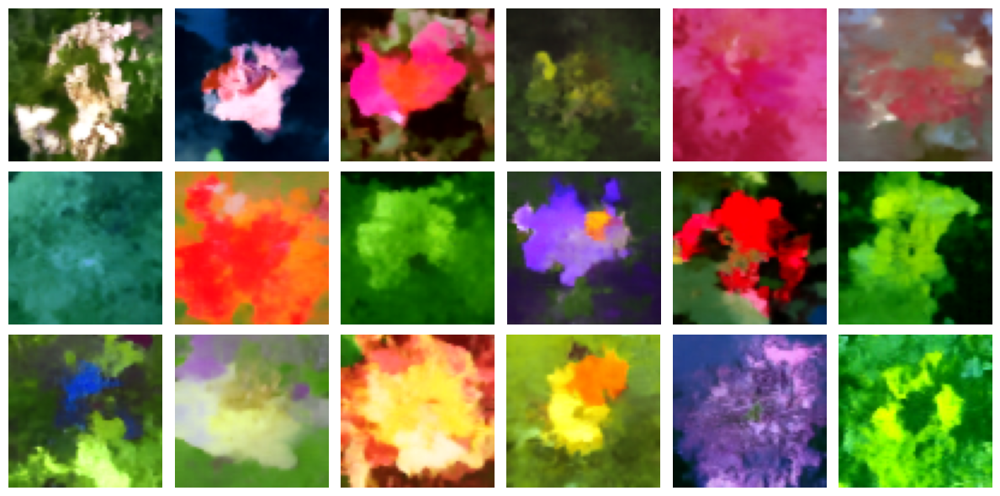

511/511 ━━━━━━━━━━━━━━━━━━━━ 151s 296ms/step - i_loss: 0.2401 - n_loss: 0.1492 - val_i_loss: 0.2374 - val_kid: 0.4634 - val_n_loss: 0.1492
Epoch 7/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - i_loss: 0.2388 - n_loss: 0.1495

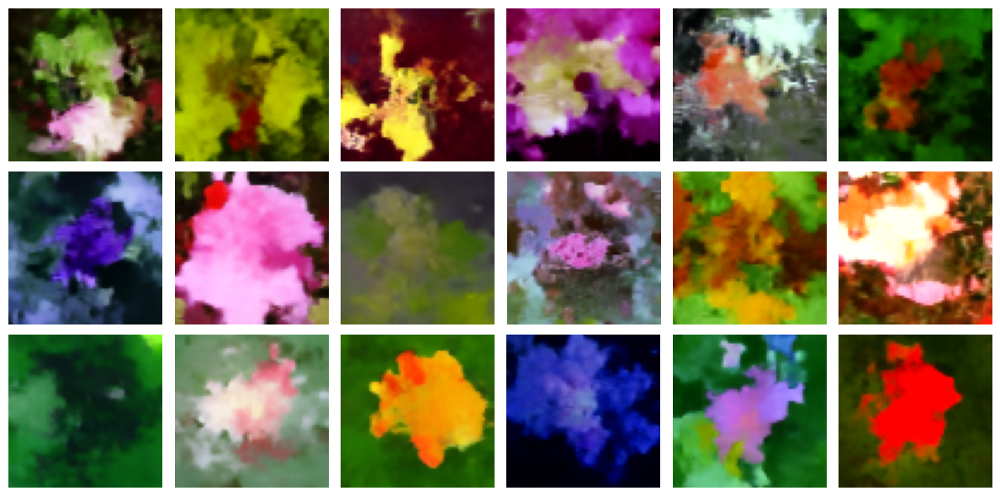

511/511 ━━━━━━━━━━━━━━━━━━━━ 152s 297ms/step - i_loss: 0.2388 - n_loss: 0.1495 - val_i_loss: 0.2376 - val_kid: 0.4563 - val_n_loss: 0.1494
Epoch 8/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step - i_loss: 0.2395 - n_loss: 0.1488

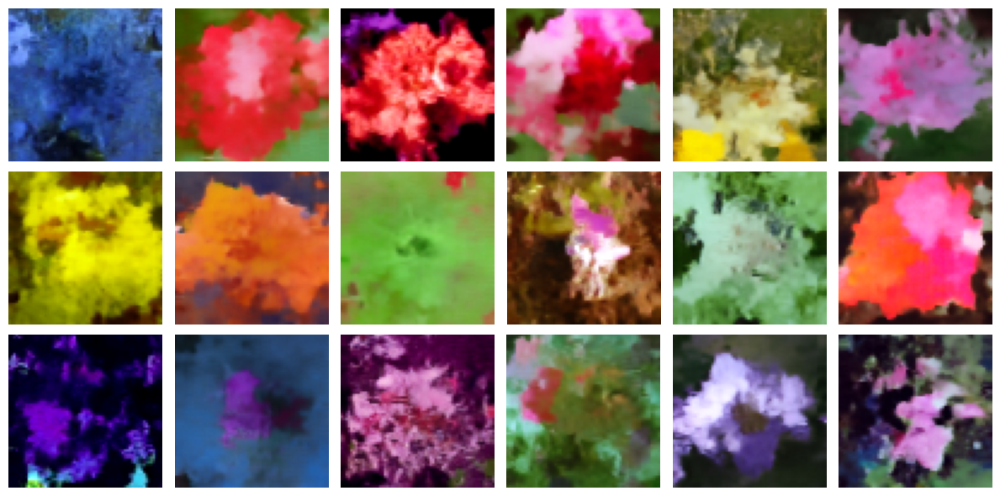

511/511 ━━━━━━━━━━━━━━━━━━━━ 152s 297ms/step - i_loss: 0.2395 - n_loss: 0.1488 - val_i_loss: 0.2379 - val_kid: 0.4550 - val_n_loss: 0.1493
Epoch 9/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - i_loss: 0.2380 - n_loss: 0.1496

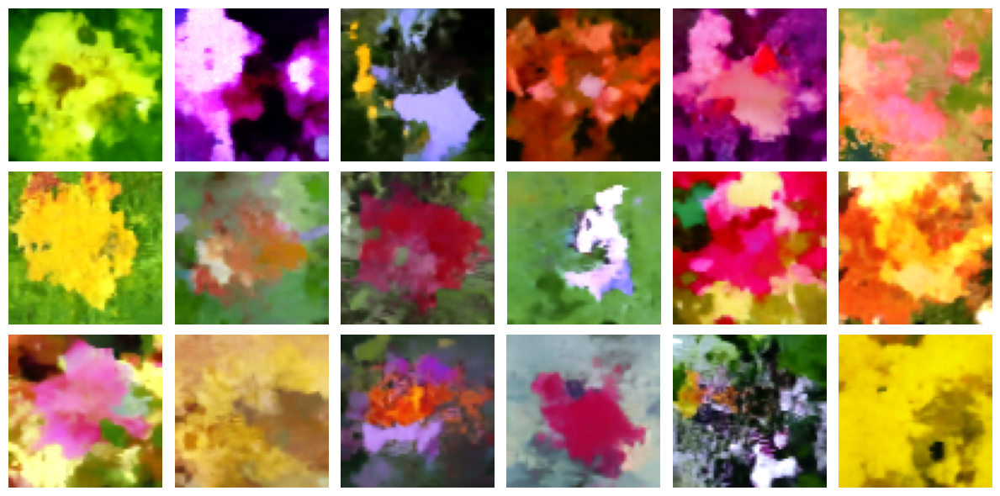

511/511 ━━━━━━━━━━━━━━━━━━━━ 151s 296ms/step - i_loss: 0.2380 - n_loss: 0.1496 - val_i_loss: 0.2369 - val_kid: 0.4581 - val_n_loss: 0.1496
Epoch 10/10
511/511 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step - i_loss: 0.2390 - n_loss: 0.1484

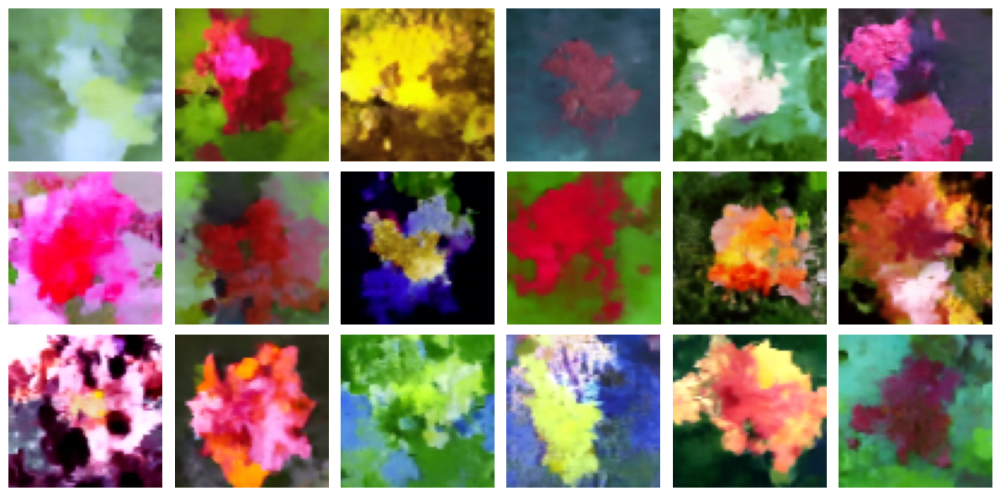

511/511 ━━━━━━━━━━━━━━━━━━━━ 151s 296ms/step - i_loss: 0.2390 - n_loss: 0.1484 - val_i_loss: 0.2389 - val_kid: 0.4632 - val_n_loss: 0.1485


In [ ]:
num_epochs = 10
# run training and plot generated images periodically
model.fit(
    train_dataset,
    epochs=num_epochs,
    validation_data=val_dataset,
    callbacks=[
        keras.callbacks.LambdaCallback(on_epoch_end=model.plot_images),
        checkpoint_callback,
        checkpoint_loss,
    ],
)

Función auxiliar para graficar las métricas del último entrenamiento.

In [ ]:
def plot_loss(history):
    """
    Plots each key in history.history as a separate subplot.
    """
    history_keys = history.history.keys()
    num_plots = len(history_keys)

    # Create subplots
    fig, axes = plt.subplots(num_plots, 1, figsize=(8, 4 * num_plots))

    # Ensure axes is iterable even if there's only one plot
    if num_plots == 1:
        axes = [axes]

    for i, key in enumerate(history_keys):
        axes[i].plot(history.history[key], label=key)
        axes[i].set_title(key, fontsize=12)
        axes[i].set_xlabel("Epochs")
        axes[i].set_ylabel("Value")
        axes[i].legend()
        axes[i].grid(True)

    # Adjust layout
    plt.tight_layout()
    plt.show()

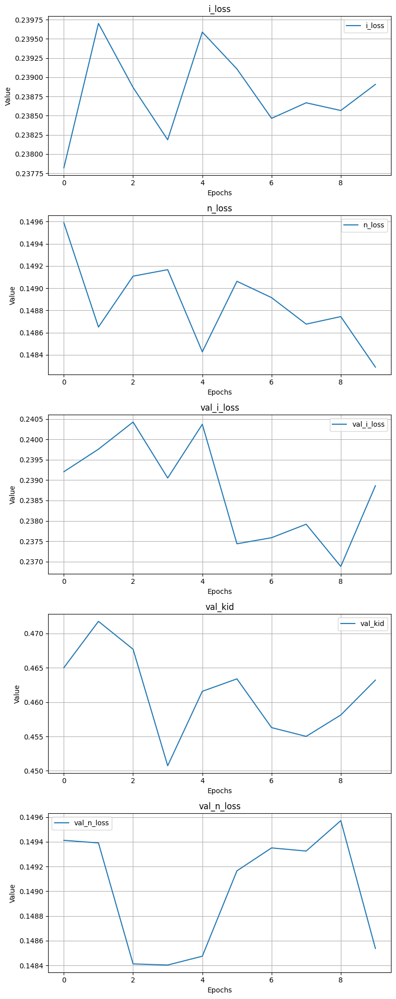

In [ ]:
plot_loss(model.history)

## Inferencia

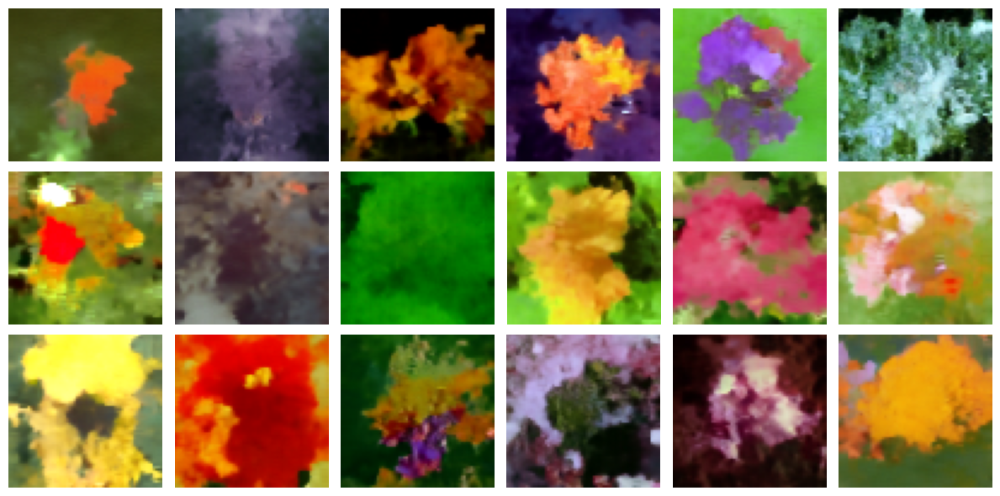

In [ ]:
# load the best model and generate images
model.load_weights(checkpoint_path)
model.plot_images()

## Resultados y conclusión

Para seguir el desempeño de un modelo a lo largo de las épocas, se tomaron en cuenta las siguientes métricas:

*   i_loss: error absoluto medio entre la imagen real y la imagen predicha por el modelo al quitar el ruido, en el conjunto de entrenamiento.
*   n_loss: error absoluto medio entre el ruido real y el ruido predicho, en el conjunto de entrenamiento.
*   val_i_loss: mismo que i_loss pero en el conjunto de validación.
*   val_n_loss: mismo que n_loss pero en el conjunto de validación.
*   val_kid: distancia kernel inception en el conjunto de validación.


La arquitectura U-Net en este experimento fue superior comparada con nuestra propuesta basada en el encoder del Transformer. Con la U-Net decrece rápido la función de costo (n_loss) y las otras métricas y con sólo 25 épocas ya se obtienen resultados buenos. En contraste con nuestro modelo, con 65 épocas sólo llegamos a obtener imágenes que pueden llegar a parecer flores en unos casos pero en otro no. Aunque sí se obtienen imágenes cuyos colores sí nos recuerdan al de las flores.

Aquí no se muestra el proceso de entrenamiento de la U-Net pero se entrenó en otro notebook para referencia. Los resultados con la U-Net se muestran a continuación, i.e., las funciones de costo y métricas y las imágenes que genera el modelo al final de 25 épocas.

Función de costo y métricas de la U-Net:

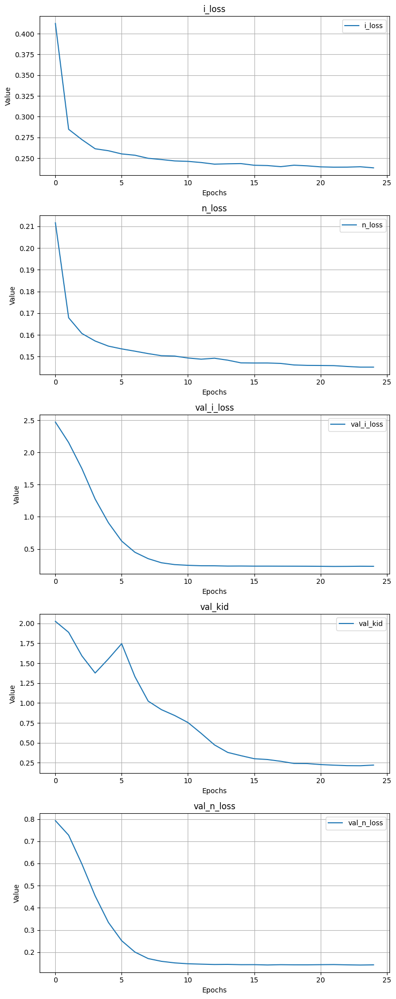



Imágenes generadas por el modelo con U-Net al final del entrenamiento:

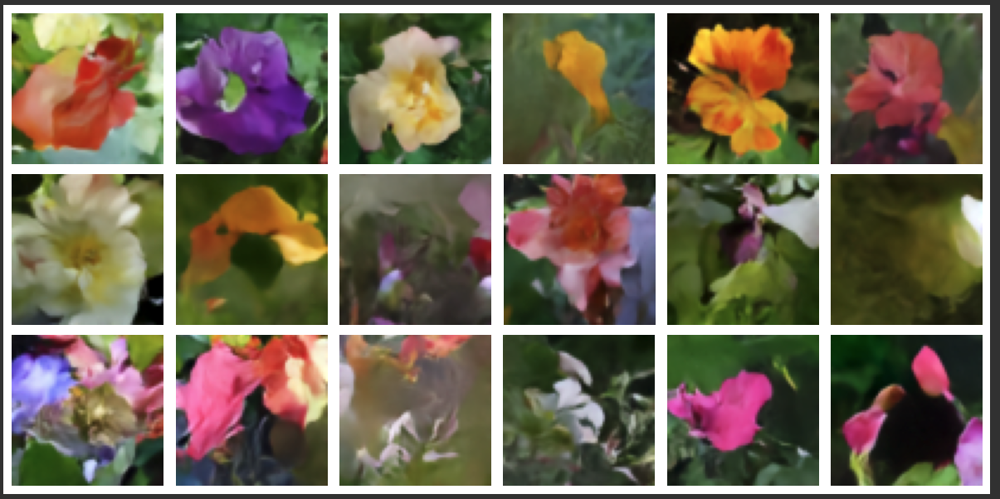

Las siguiente gráfica contiene las métricas correspondientes a los batches de entrenamiento para el modelo basado en el Transformer. La columna i del gráfico contiene las métricas del batch de entrenamiento i. Ojo: fijando una métrica, los ejes verticales de las gráficas correspondientes en cada batch de entrenamiento NO tienen la misma escala.

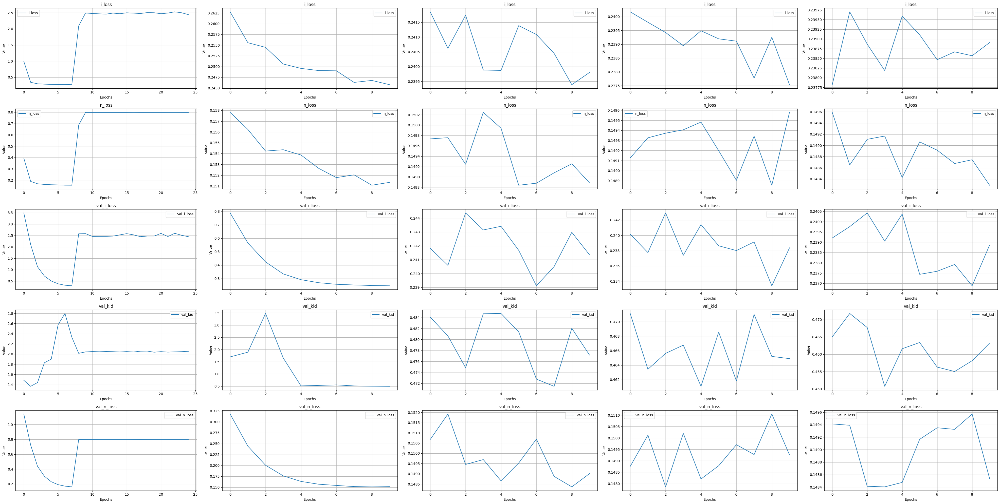

Tomando los mejores pesos encontrados en cada batch de entrenamiento, se generaron las siguientes imágenes. La columna i corresponde al batch de entrenamiento i.

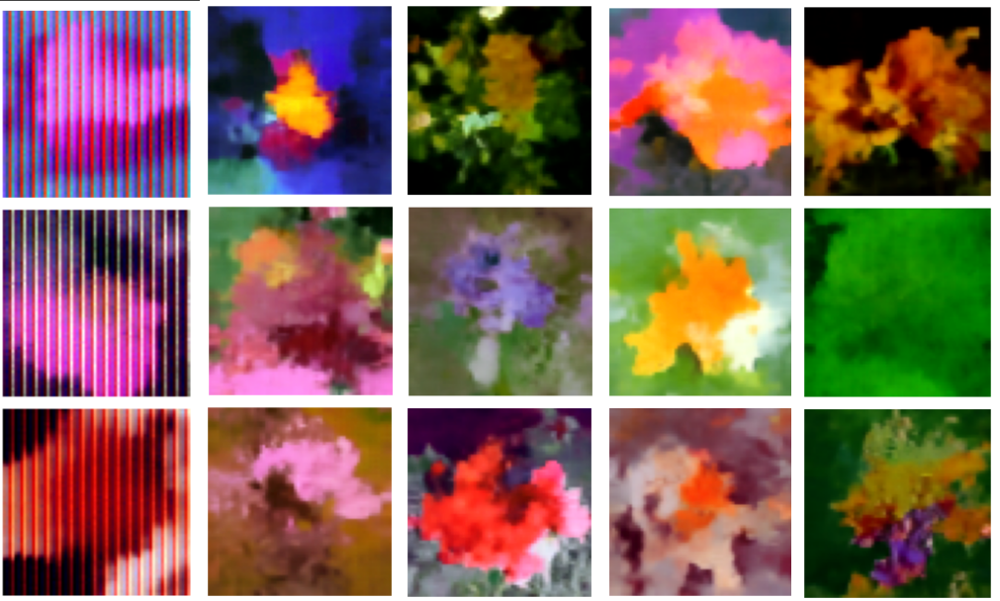

Al final, el mejor modelo obtenido usando un encoder de transformer genera las siguientes imágenes:

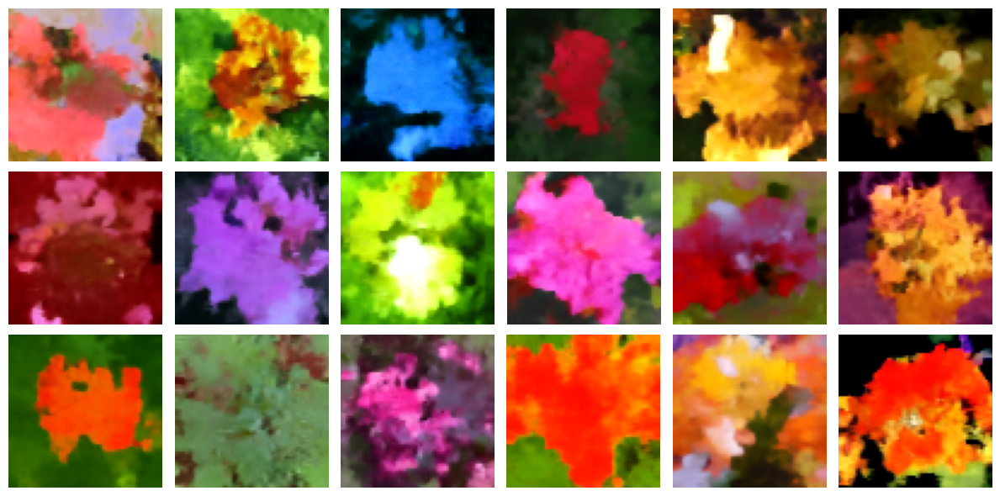

In [34]:
model.plot_images()

En conclusión, juzgando por las gráficas de las métricas, nuestro modelo propuesto se estanca en un mínimo local que no genera buenas imágenes. Además es inestable pues de vez en cuando el optimizador generaba pesos con costo muy alto a pesar de ya estar cerca de un mínimo relativamente bueno. Por otro lado, el modelo basado en la U-Net rápidamente genera buenas imágenes y no se queda estancado durante la optimización, llegando a mejorar bastante hasta generar imágenes que sí parecen flores.